<a href="https://colab.research.google.com/github/trDalmi/Data-Science-Portfolio/blob/main/Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageFont
from PIL import ImageDraw
from PIL import ImageOps
import time
import ssl

In [ ]:
import tensorflow as tf

import tensorflow_hub as hub

import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageFont
from PIL import ImageDraw
from PIL import ImageOps

import time

print(tf.__version__)
print("The following GPU devices are available: %s"%tf.test.gpu_device_name())

2.17.1
The following GPU devices are available: /device:GPU:0


In [ ]:
module_handle="https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

In [ ]:
model = hub.load(module_handle)

In [ ]:
detector = model.signatures['default']

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

def download_and_resize_image(url,new_width=256,new_height=256,context = None,display = False):
  _,filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url,context = context)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image,(new_width,new_height), Image.Resampling.LANCZOS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename,format="JPEG",quality = 90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)


  return filename

Image downloaded to /tmp/tmp36ngkrvv.jpg.


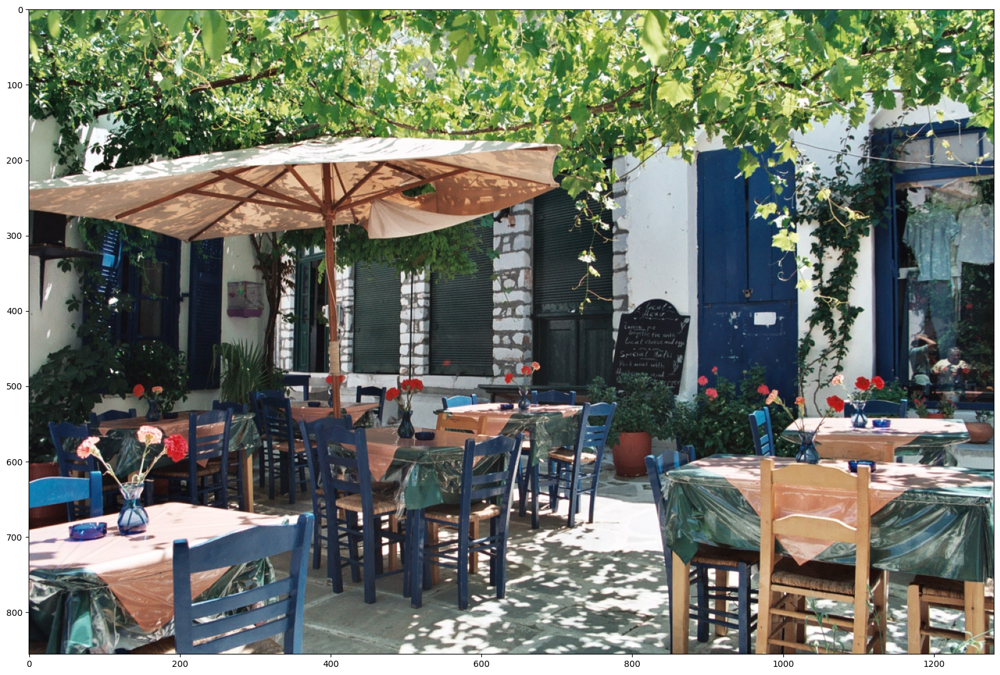

In [ ]:
import ssl

context = ssl._create_unverified_context()

image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"
downloaded_image_path = download_and_resize_image(image_url,1280,856,context,True)

In [ ]:
def draw_bounding_box_on_image(image,
                              ymin,
                              xmin,
                              ymax,
                              xmax,
                              color,
                              font,
                              thickness=4,
                              display_str_list=()):
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                  ymin * im_height, ymax * im_height)

    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
              (left, top)],
              width=thickness,
              fill=color)

    display_str_heights = [font.getbbox(ds)[3] for ds in display_str_list]
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = bottom + total_display_str_height

    for display_str in display_str_list[::-1]:
        # Modified line to unpack all 4 values from getbbox()
        x0, y0, x1, y1 = font.getbbox(display_str)
        # Calculate text width and height from the bounding box coordinates
        text_width = x1 - x0
        text_height = y1 - y0
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                        (left + text_width, text_bottom)],
                        fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),
                  display_str,
                  fill="black",
                  font=font)
        text_bottom -= text_height - 2 * margin
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    """
    Overlay labeled boxes on an image with formatted scores and label names.

    Args:
        image -- the image as a numpy array
        boxes -- list of detection boxes
        class_names -- list of classes for each detected object
        scores -- numbers showing the model's confidence in detecting that object
        max_boxes -- maximum detection boxes to overlay on the image (default is 10)
        min_score -- minimum score required to display a bounding box

    Returns:
        image -- the image after detection boxes and classes are overlaid on the original image.
    """
    colors = list(ImageColor.colormap.values())

    try:
        font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
    except IOError:
        print("Font not found, using default font.")
        font = ImageFont.load_default()

    for i in range(min(boxes.shape[0], max_boxes)):

        # only display detection boxes that have the minimum score or higher
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                         int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")

            # draw one bounding box and overlay the class labels onto the image
            draw_bounding_box_on_image(image_pil,
                                       ymin,
                                       xmin,
                                       ymax,
                                       xmax,
                                       color,
                                       font,
                                       display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))

    return image

In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels =3)
  return img
def run_detector(detector,path):
  img = load_img(path)
  converted_img = tf.image.convert_image_dtype(img,tf.float32)[tf.newaxis,...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  56.78603529930115


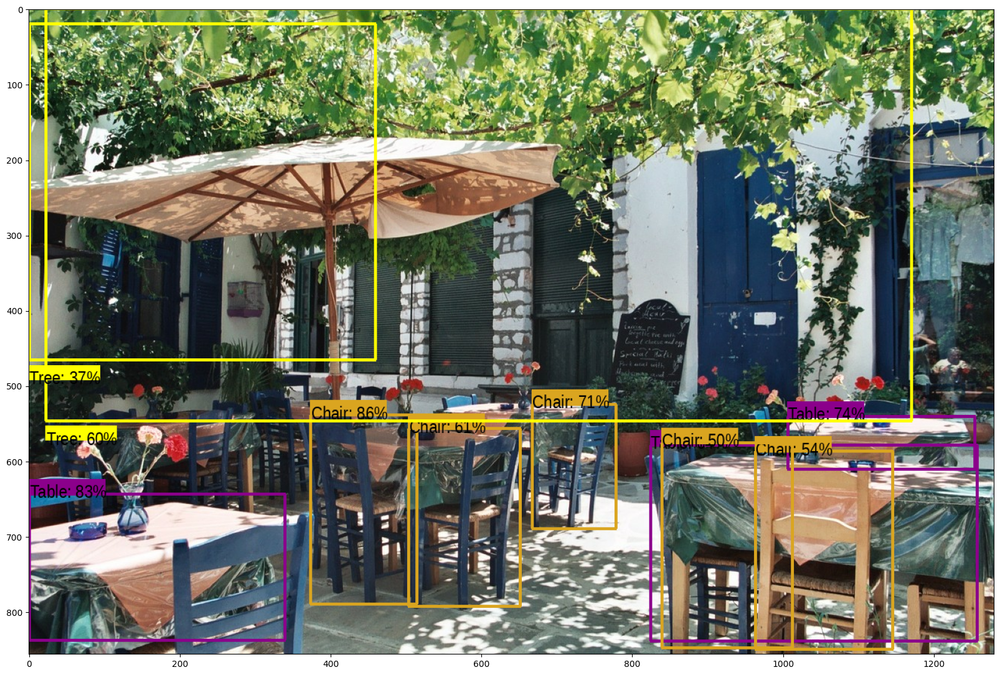

In [ ]:
run_detector(detector,downloaded_image_path)

Image downloaded to /tmp/tmp6gr2bw9_.jpg.
Found 100 objects.
Inference time:  3.364025115966797
Inference time: 3.511665105819702
Image downloaded to /tmp/tmpn4hmr3jq.jpg.
Found 100 objects.
Inference time:  1.2061874866485596
Inference time: 1.3035781383514404
Image downloaded to /tmp/tmp6ncf98or.jpg.
Found 100 objects.
Inference time:  1.4047284126281738
Inference time: 1.5762665271759033


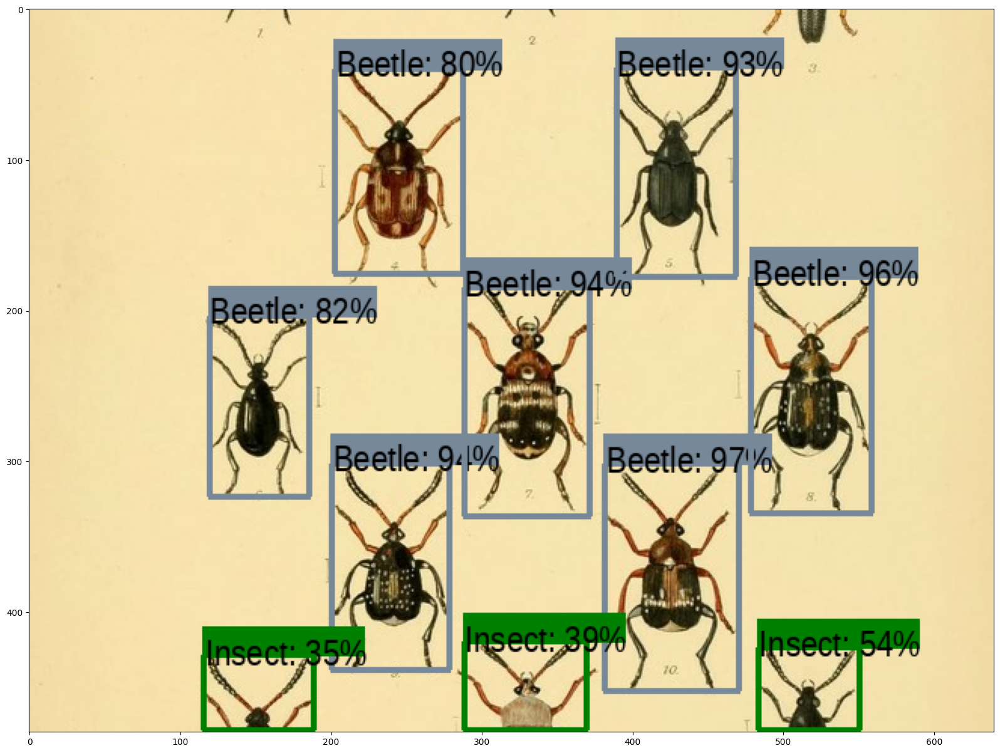

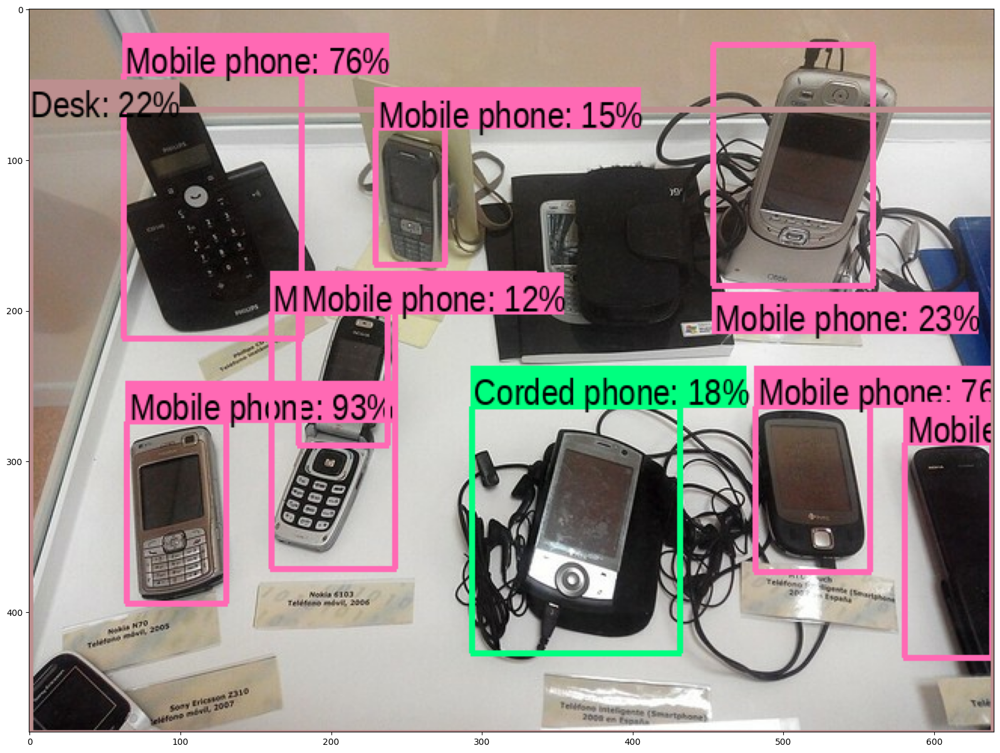

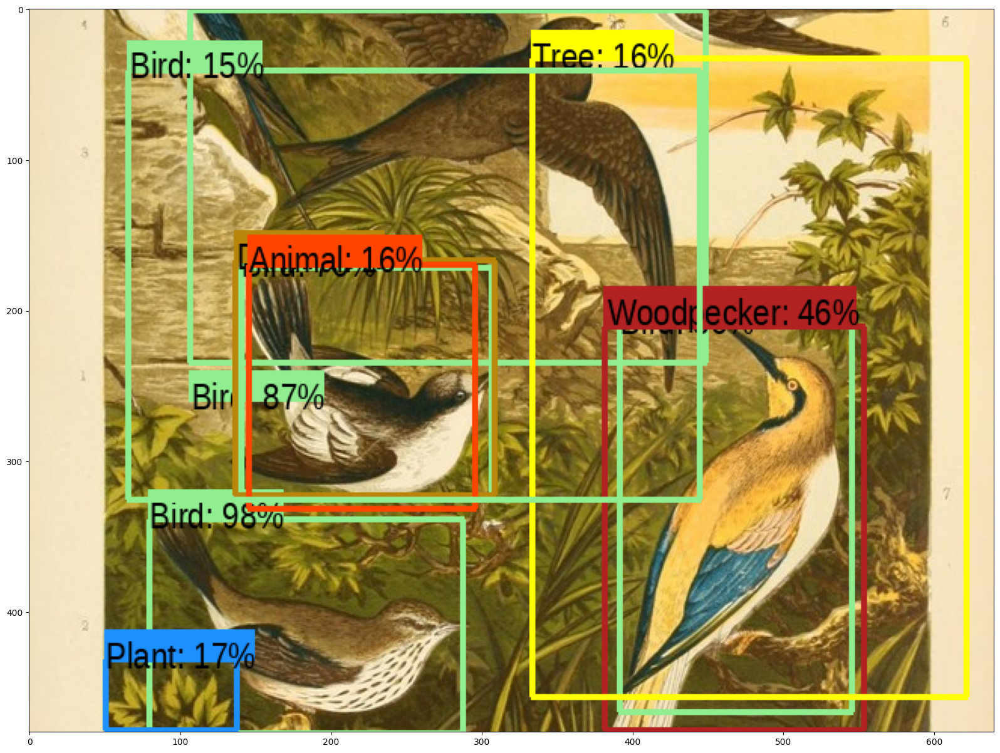

In [ ]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
    start_time = time.time()
    image_path = download_and_resize_image(image_url, 640, 480, context)
    run_detector(detector, image_path)
    end_time = time.time()
    print("Inference time:",end_time-start_time)
for img in image_urls:
  detect_img(img)
